___________________________________________________________________________

**Introduction: Problems and Objectives**  

The main problem that we aimed to solve in this project was to gain a better understanding of the behavior and topology of a network based on its event data.  
By analyzing this data and creating visual representations of it using NetworkX and other Python libraries, we hoped to identify patterns and relationships that could help us gain insights into how the network operates.

Our objectives in this project were to:

* Read and describe the dataset in detail, including the relationships between different attributes
* Use statistical tools to represent the data using charts and other visualizations
*Create three different graph representations of the data using NetworkX, focusing on different attributes
* Automate the process of creating these graph representations so that users can easily choose which attribute to use as nodes and edges
* Visualize the graph representations to gain a better understanding of the network's topology
* Create a function to find paths between different nodes in the network
* Use graph analysis tools to calculate degree connectivity, closeness centrality, betweenness centrality, network density, network diameter, and network average path length
* Use colors to represent differences between protocols in the graph representations
* Provide a final analysis of the graph representations and propose algorithms that could be used to further analyze the network's behavior and topology.  

Overall, our goal was to gain a comprehensive understanding of the network based on its event data, and to use this understanding to identify areas where further analysis or optimization could be beneficial.

___________________________________________________________________________


**Part One**  

We imported several Python libraries for our analysis  

* **Pandas** was used to analyze and upload data in CSV format.
* **NetworkX** was used to create, manipulate, and analyze complex networks.
* **Matplotlib** was used to create static, interactive, and animated visualizations.
* **NumPy** was used for numerical computing.
* **Seaborn** was used for data visualization.
* **LabelEncoder** from scikit-learn was used to transform categorical values to numerical values for correlation analysis (**heatmap**).

In [29]:
import pandas as pd # analyse data, upload csv
import networkx as nx # creation, manipulation, and analysis of complex networks. I
import matplotlib.pyplot as plt # creating static, interactive, and animated visualizations 
import numpy as np # for numerical computing
import seaborn as sns # visualisation
from sklearn.preprocessing import LabelEncoder # to transform categorical values to numerical for correlation(heatmap)
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)



We combined three separate datasets into one dataframe to simplify our analysis and allow us to easily explore the relationships between different attributes in the data. 

In [30]:
# read CSV files into dataframes
df1 = pd.read_csv('C:/Users/mikac/Downloads/UNSW_2018_IoT_Botnet_Dataset_1.csv',header=None)
df3 = pd.read_csv('C:/Users/mikac/Downloads/UNSW_2018_IoT_Botnet_Dataset_3.csv',header=None)
df5 = pd.read_csv('C:/Users/mikac/Downloads/UNSW_2018_IoT_Botnet_Dataset_5.csv',header=None)

# combine all dataframes
df = pd.concat([df1, df3, df5]).copy()


# set column names
column_names = ['pkSeqID', 'stime', 'flgs', 'proto', 'saddr', 'sport', 'daddr', 'dport', 'pkts', 'bytes', 'state', 'ltime', 'seq', 'dur', 'mean', 'stddev', 'smac', 'dmac', 'sum', 'min', 'max', 'soui', 'doui', 'sco', 'dco', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'srate', 'drate', 'attack', 'category', 'subcategory']
df.columns = column_names
df1.columns = column_names
df3.columns = column_names
df5.columns = column_names

df_nonnull = df.dropna(subset=['saddr', 'daddr']).copy()


df_nonnull.head()

,pkSeqID,stime,flgs,proto,saddr,sport,daddr,dport,pkts,bytes,state,ltime,seq,dur,mean,stddev,smac,dmac,sum,min,max,soui,doui,sco,dco,spkts,dpkts,sbytes,dbytes,rate,srate,drate,attack,category,subcategory
0,1,1.526344e+09,e,arp,192.168.100.1,NaN,192.168.100.3,NaN,4,240,CON,1.526345e+09,9,1195.996582,0.000006,0.000002,NaN,NaN,0.000011,0.000004,0.000007,NaN,NaN,NaN,NaN,2,2,120,120,0.002508,0.000836,0.000836,0,Normal,Normal
1,2,1.526344e+09,e,tcp,192.168.100.7,139,192.168.100.4,36390,10,680,CON,1.526346e+09,10,1453.945923,0.000028,0.000008,NaN,NaN,0.000138,0.000022,0.000042,NaN,NaN,NaN,NaN,5,5,350,330,0.006190,0.002751,0.002751,0,Normal,Normal
2,3,1.526344e+09,e,udp,192.168.100.149,51838,27.124.125.250,123,2,180,CON,1.526344e+09,11,0.048565,0.048565,0.000000,NaN,NaN,0.048565,0.048565,0.048565,NaN,NaN,NaN,NaN,1,1,90,90,20.590960,0.000000,0.000000,0,Normal,Normal
3,4,1.526344e+09,e,arp,192.168.100.4,NaN,192.168.100.7,NaN,10,510,CON,1.526346e+09,12,1454.080322,0.000238,0.000022,NaN,NaN,0.001189,0.000199,0.000261,NaN,NaN,NaN,NaN,5,5,210,300,0.006189,0.002751,0.002751,0,Normal,Normal
4,5,1.526344e+09,e,udp,192.168.100.27,58999,192.168.100.1,53,4,630,CON,1.526345e+09,14,569.933960,0.098505,0.080150,NaN,NaN,0.197011,0.018356,0.178655,NaN,NaN,NaN,NaN,2,2,174,456,0.005264,0.001755,0.001755,0,Normal,Normal


The features include identifiers such as the row identifier 'pkSeqID' and source and destination IP addresses and ports, as well as transaction details such as the total count of packets and bytes, transaction state, duration, and rates of packets per second. Additionally, there are features that represent the total number of bytes and packets per source IP and destination IP, as well as per protocol and per destination/source port. There are also features that represent the average rate per protocol per source IP/destination IP, and the number of packets grouped by state of flows and protocols per destination/source IP. Finally, the 'attack' column is a class label, with 0 representing normal traffic and 1 representing attack traffic, while the 'category' and 'subcategory' columns provide information on the traffic category and subcategory.

___________________________________________________________________________

**FEATURE DESCRIPTION**

In [67]:
# attribute descriptions
attributes = pd.read_excel('C:/Users/mikac/Downloads/Total Feature Description.xlsx',index_col=[0]).reset_index(drop=True)
for i,row in attributes.iterrows():
  print(str(row['Feature'])+ ": " + str(row['Description']))


pkSeqID: Row Identifier
Stime: Record start time
Flgs: Flow state flags seen in transactions
flgs_number: Numerical representation of feature flags
Proto: Textual representation of transaction protocols present in network flow
proto_number: Numerical representation of feature proto
Saddr: Source IP address
Sport: Source port number
Daddr: Destination IP address
Dport: Destination port number
Pkts: Total count of packets in transaction
Bytes: Totan number of bytes in transaction
State: Transaction state
state_number: Numerical representation of feature state
Ltime: Record last time
Seq: Argus sequence number
Dur: Record total duration
Mean: Average duration of aggregated records
Stddev: Standard deviation of aggregated records
Sum: Total duration of aggregated records
Min: Minimum duration of aggregated records
Max: Maximum duration of aggregated records
Spkts: Source-to-destination packet count
Dpkts: Destination-to-source packet count
Sbytes: Source-to-destination byte count
Dbytes: D

___________________________________________________________________________

**4. Use statistical tools to represent the data using charts and other tools.**  

**Heat Map**  

We used a heatmap to visualize the relationships between different attributes in our dataset.  
Specifically, we used it to create a correlation matrix that shows how strongly each pair of attributes is related to each other.  

The categorical columns that were encoded are:
* 'proto'
* 'saddr'
* 'daddr'
* 'category'
* 'subcategory'.  

Encoding these columns converts the categorical values to numerical values, which is necessary for performing correlation analysis and building machine learning models.

,pkSeqID,stime,proto,saddr,daddr,pkts,bytes,dur,rate,srate,attack,category,subcategory
0,1,1.526344e+09,0,0,27,4,240,1195.996582,0.002508,0.000836,0,1,0
1,2,1.526344e+09,3,12,28,10,680,1453.945923,0.006190,0.002751,0,1,0


<Axes: >

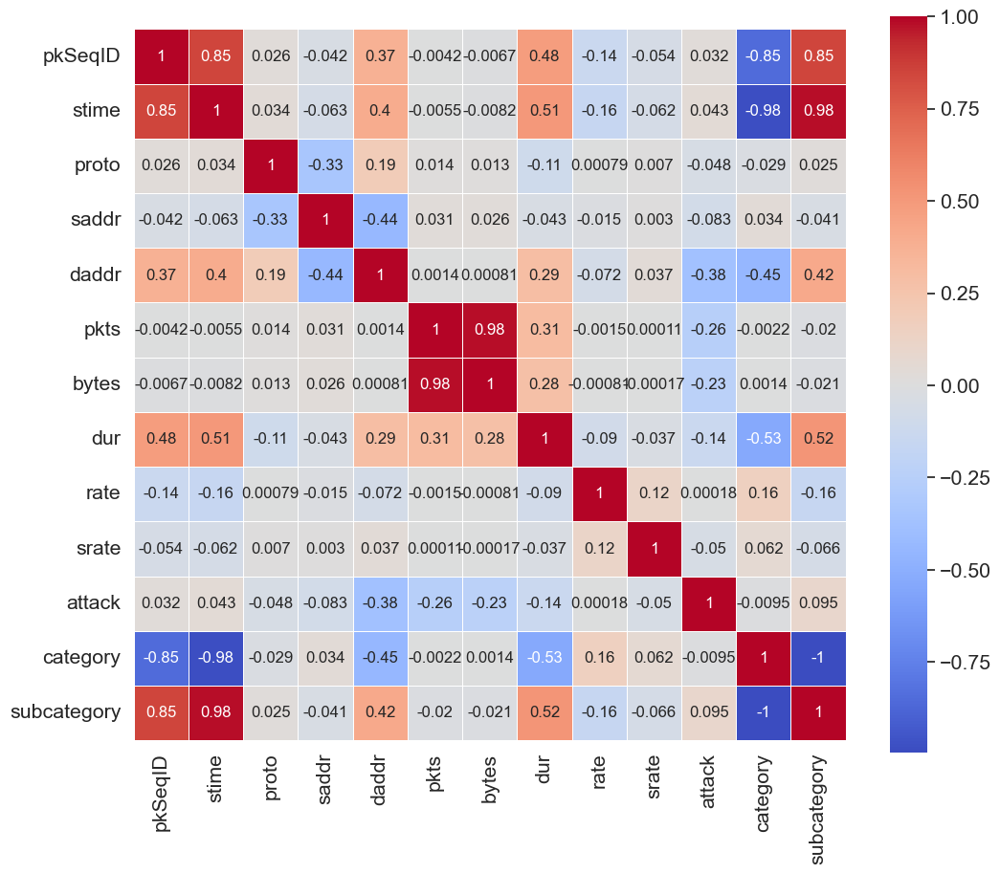

In [5]:
# take columns which can be related to each other
'''these columns are relevant to the attributes of interest in the dataset,
such as packet count, bytes transmitted, duration, etc. '''

new_df = df[["pkSeqID", "stime",'proto','saddr','daddr',"pkts", "bytes", "dur", "rate",'srate', "attack", "category", "subcategory"]].copy()
# create a LabelEncoder object
le = LabelEncoder()

# encode category and subcategory columns
new_df['proto'] = le.fit_transform(new_df['proto'])
new_df['saddr'] = le.fit_transform(new_df['saddr'])
new_df['daddr'] = le.fit_transform(new_df['daddr'])
new_df['category'] = le.fit_transform(new_df['category'])
new_df['subcategory'] = le.fit_transform(new_df['subcategory'])

display(new_df.head(2))

# Set font size and spacing
sns.set(font_scale=1.2)
sns.set(rc={'figure.figsize':(12,10)})
sns.set(font_scale=1.4)

# Create correlation matrix
corr = new_df.corr()

# Create heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"size": 12}, square=True)



**Some analysis from heatmap on feature correlation**  

There is:
* **a high positive correlation between "stime" and "category" (0.98) as well as "stime" and "subcategory" (0.98)**

indicating that there is a strong linear relationship between the start time of the communication and the type of attack/subcategory.

**This means that certain types of attacks or subcategories are more likely to occur at specific times or time ranges.**


On the other hand, there is:
* **a moderate positive correlation between "stime" and "duration" (0.51) and "dur(Record total duration)" and "subcategory" (0.52)**

suggesting that there is a weak to moderate linear relationship between the duration of the communication and the type of attack/subcategory.

___________________________________________________________________________

**The Bar Chart**
  
The bar chart shows the frequency of different attack types in the dataset. The blue bars represent one type of attack, and the red bars represent another. The height of each bar represents the number of occurrences of that type of attack in the dataset.

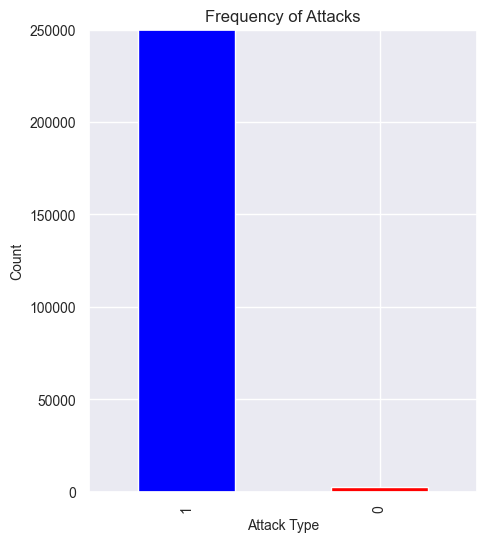

In [6]:
# create bar chart of attack frequency
plt.figure(figsize=(5,6))
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
attack_counts = df['attack'].value_counts()
attack_counts.plot(kind='bar', color=['blue', 'red'])
plt.title('Frequency of Attacks', fontsize=12)
plt.xlabel('Attack Type', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.ylim(0, 250000)
plt.show()

* Attack 1 has the highest frequency, with a bar that reaches the top of the graph. 
* The red bar, representing another type of attack, is very small.

___________________________________________________________________________
**Duration in seconds required to sent packages**

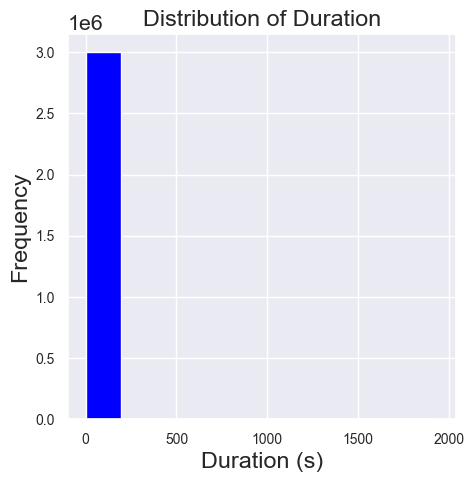

In [7]:
# create histogram of duration
plt.figure(figsize=(5,5))
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
df['dur'].hist(color='blue')
plt.title('Distribution of Duration')
plt.xlabel('Duration (s)')
plt.ylabel('Frequency')
plt.show()

It seems like the majority of packets have a duration of 0 to 500 seconds, with a single bar in the histogram reaching the maximum frequency value.   

The x-axis represents the duration of packets in seconds, while the y-axis represents the frequency of packets with a given duration.

___________________________________________________________________________
**Box Plot**  

The box plot is showing the distribution of bytes transmitted in each category

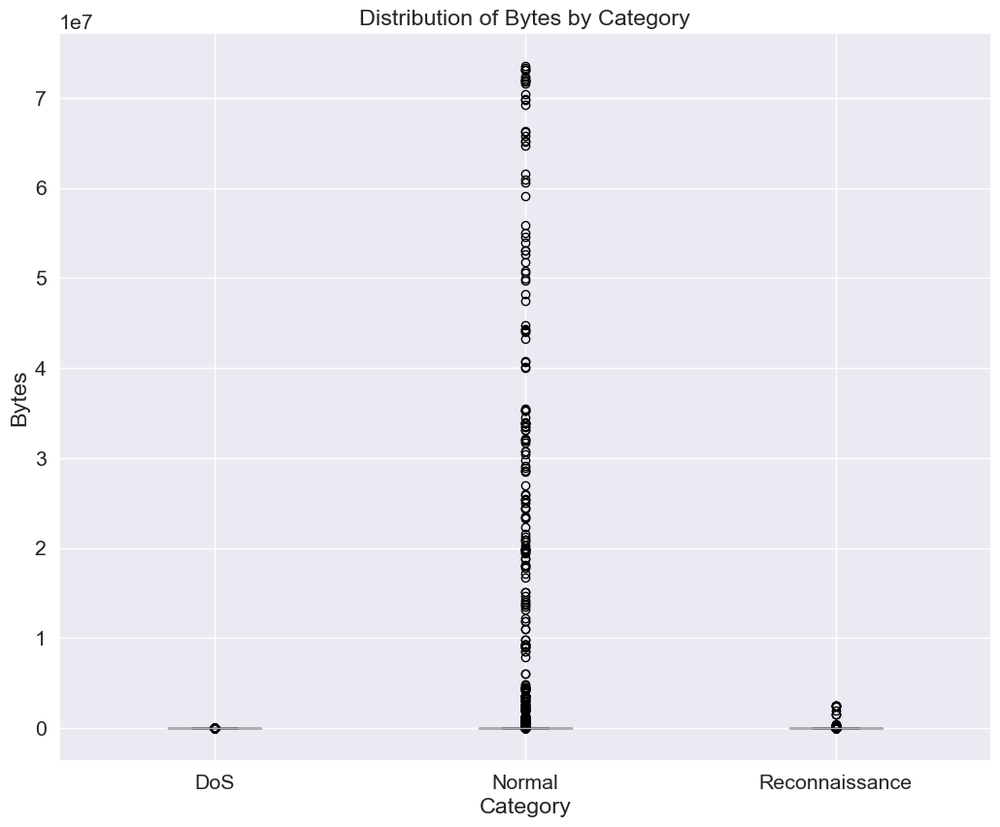

In [8]:
# create box plot of bytes
df.boxplot(column='bytes', by='category')
plt.title('Distribution of Bytes by Category')
plt.suptitle('')
plt.xlabel('Category')
plt.ylabel('Bytes')
plt.show()

The normal category seems to have the highest median byte count and the widest range of byte counts, with many outliers beyond the whiskers.

___________________________________________________________________________  
**The scatter plot of duration vs bytes** shows a relationship between the duration of a packet transmission and the number of bytes sent during that transmission.

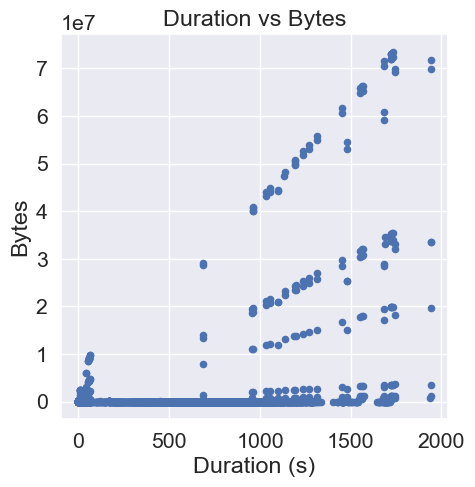

In [9]:
# create scatter plot of duration vs bytes
fig, ax = plt.subplots(figsize=(5, 5))
df.plot.scatter(x='dur', y='bytes', ax=ax)
ax.set_title('Duration vs Bytes')
ax.set_xlabel('Duration (s)')
ax.set_ylabel('Bytes')
plt.show()

**From Graph:** 
* Positive Correlation between two variables
* As the duration of transmission increases, so does the number of bytes sent
* Linear relationship => a consistent data transfer rate between the nodes in the network


___________________________________________________________________________  

**PART 2, 5a | First representation uses “IP” as a node and an event as edges**  

In the case of the network traffic data, it's possible to have multiple rows with the same source and destination IP addresses, but different protocols. For example, two different protocols might be used to transfer different types of data between the same source and destination. In this case, we would consider each row as a separate event between the same source and destination IP addresses, and include the protocol as an edge attribute in the graph. This allows us to visualize the different types of traffic between the different IP addresses in the network.


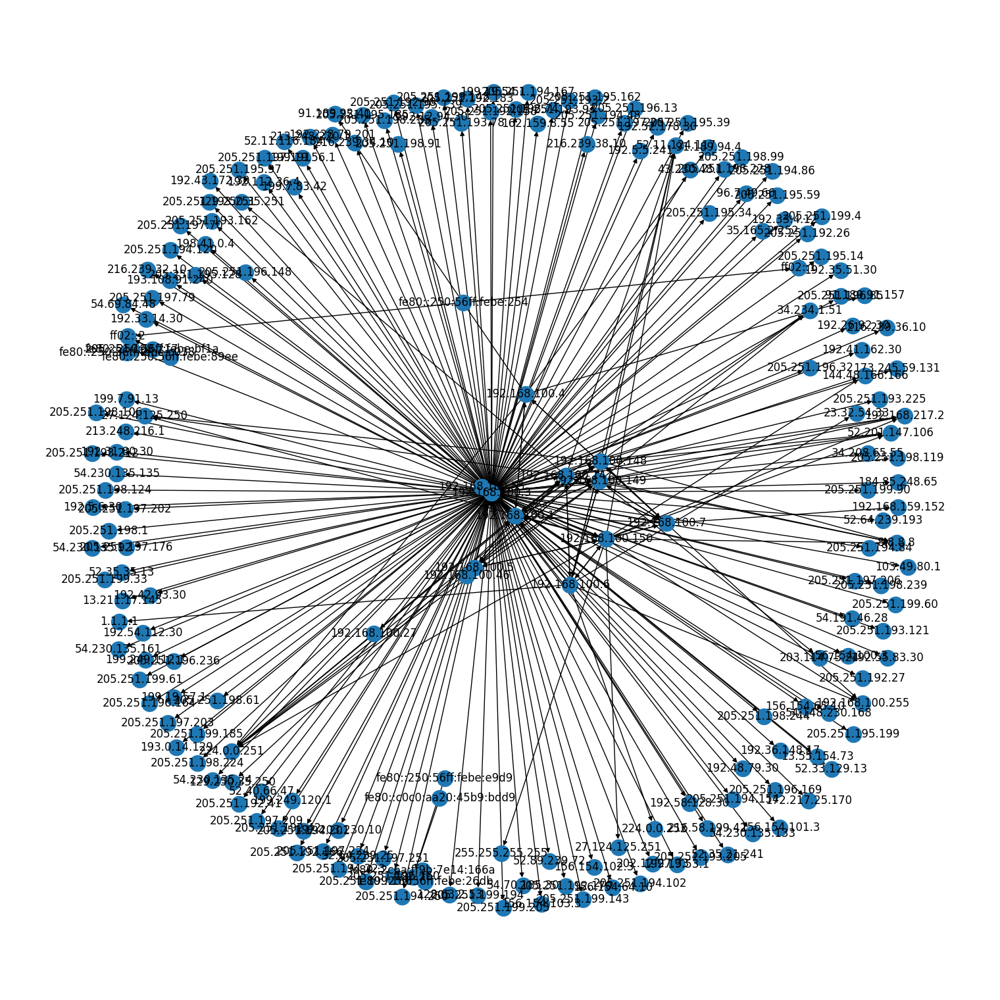

In [31]:
# Create a new graph object
G = nx.DiGraph()

# Add the nodes to the graph
src_ips = set(df_nonnull['saddr'])
dst_ips = set(df_nonnull['daddr'])
G.add_nodes_from(src_ips)
G.add_nodes_from(dst_ips)

# Create the edges in the graph
edges = df_nonnull[['saddr', 'daddr', 'proto']]
for row in edges.itertuples(index=False):
    G.add_edge(row[0], row[1], proto=row[2])

# Plot the graph using the spring_layout function
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G)
nx.draw(G, pos=pos, with_labels=True)

# Show the plot
plt.show()


___________________________________________________________________________
**We can use also bipartite graph**    

We added the bipartite graph with two types of nodes: source IP addresses and destination IP addresses. Using the bipartite layout allows for a clear visualization of the bipartite structure of the graph, with the source IPs on one side and the destination IPs on the other side.

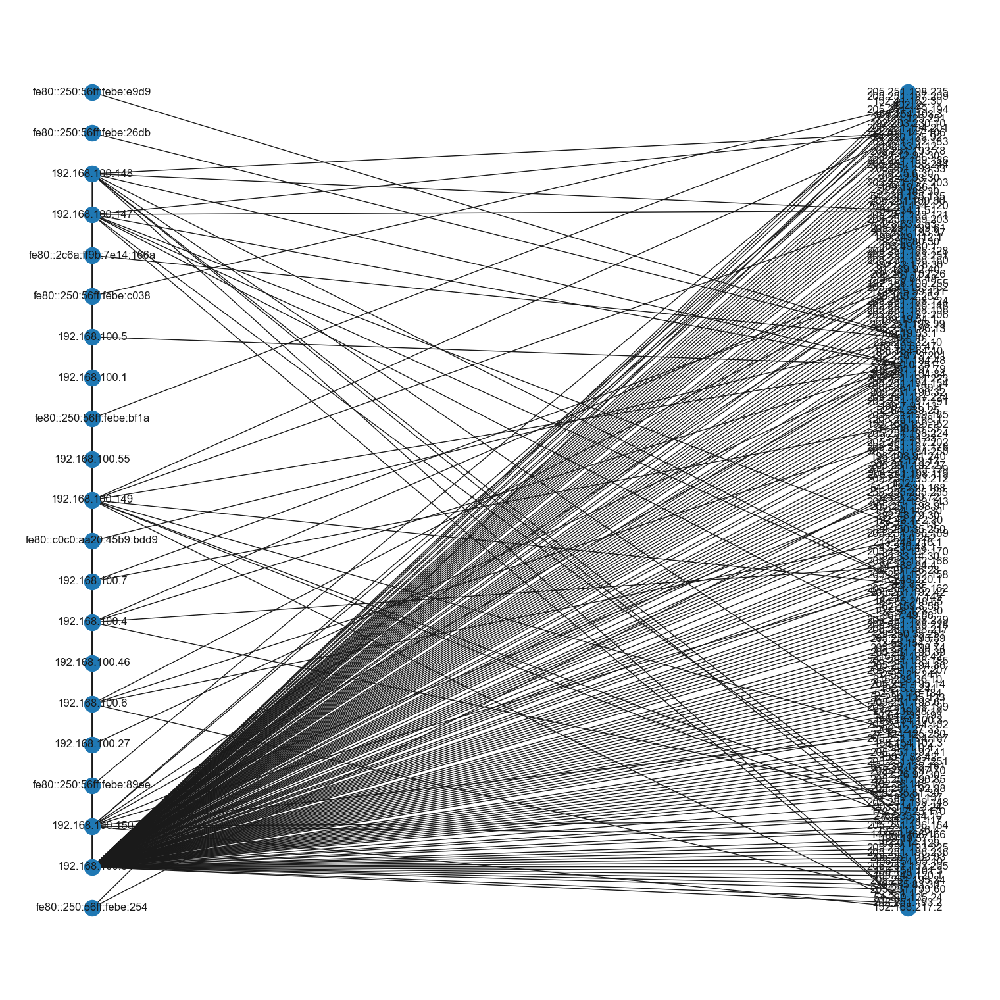

In [43]:
import pandas as pd
import networkx as nx

# Load the data from the CSV file into a Pandas DataFrame
# Create a new graph object
G2 = nx.Graph()

# Add the nodes to the graph
src_ips = set(df_nonnull['saddr'])
dst_ips = set(df_nonnull['daddr'])
G2.add_nodes_from(src_ips, bipartite=0)
G2.add_nodes_from(dst_ips, bipartite=1)

# Create the edges in the graph
edges = df_nonnull[['saddr', 'daddr', 'proto']]
for row in edges.itertuples(index=False):
    G2.add_edge(row[0], row[1], proto=row[2])


# Plot the graph using the bipartite_layout function
plt.figure(figsize=(15, 15))

pos = nx.bipartite_layout(G, src_ips)
nx.draw(G2, pos=pos, with_labels=True)
plt.show()



___________________________________________________________________________

**Part2 5b | Second representation uses event (row) as a node.**  

This code creates a graph where each row in the dataset represents a node. The edges between nodes are created based on the source and destination addresses of each network event. The resulting graph shows the interactions between network events, which can be useful for identifying patterns and trends in the network traffic.  

Each row representing a unique event and each edge indicating a communication between two events. 

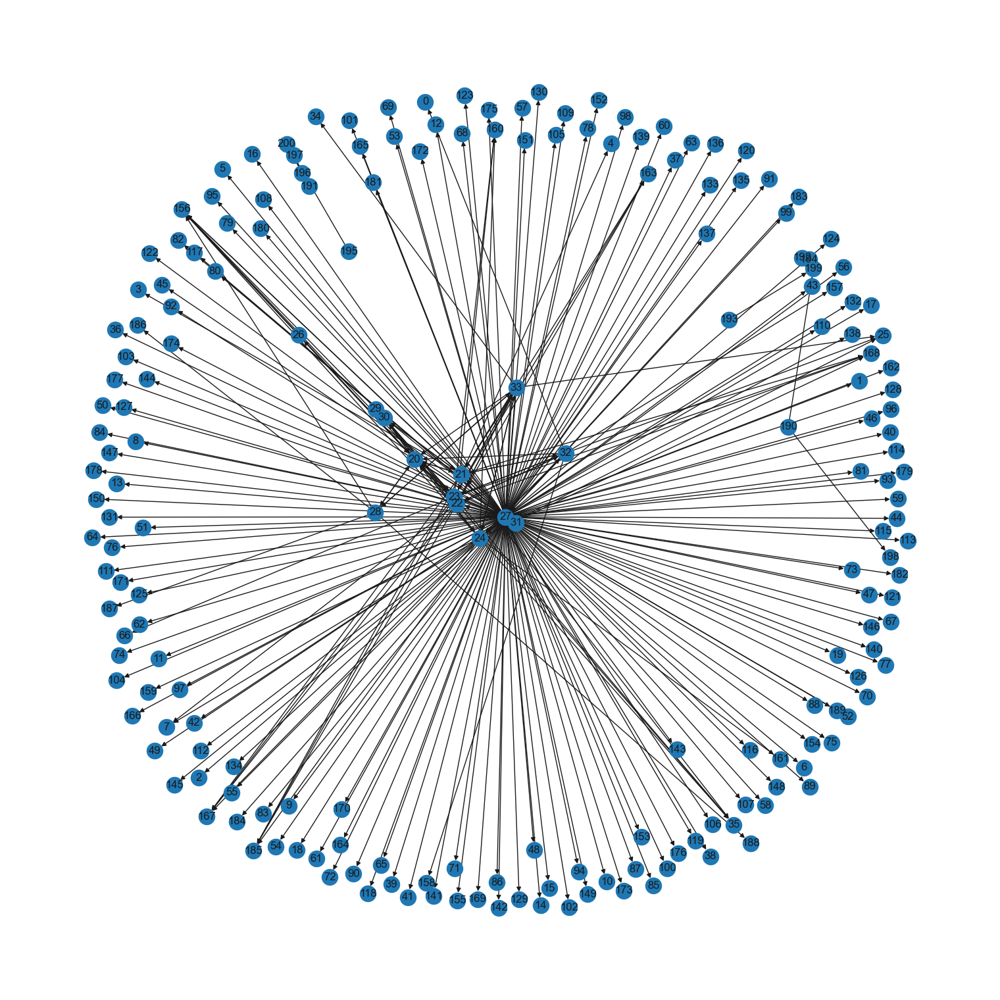

In [45]:
# create an empty graph
G3 = nx.DiGraph()

# get a list of unique addresses
unique_addrs = np.unique(np.concatenate([df_nonnull['saddr'], df_nonnull['daddr']]))

# create a dictionary to store the node indices for each address
node_indices = dict(zip(unique_addrs, range(len(unique_addrs))))

# create a numpy array to store the edges
num_edges = len(df_nonnull)
edge_array = np.zeros((num_edges, 2), dtype=int)

# iterate over the rows of the DataFrame
for i, row in enumerate(df_nonnull.itertuples()):
    saddr_idx = node_indices[row.saddr]
    daddr_idx = node_indices[row.daddr]
    edge_array[i] = [saddr_idx, daddr_idx]

# add the nodes and edges to the graph
G3.add_nodes_from(range(len(unique_addrs)))
G3.add_edges_from(edge_array)

# plot the graph
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G3, seed=42)
nx.draw(G3, pos, with_labels=True)
plt.show()


___________________________________________________________________________

**Part two, 5c | Third representation uses any attribute that you decide as a node.**  

For the third representation, we can choose any attribute as a node. Let's say we want to create a graph where each node represents a unique source IP address and the edges represent the number of connections between them. To create this graph, we can use the groupby function to group the data by source IP address and count the number of connections between each pair of source IP addresses. Here is an example code:

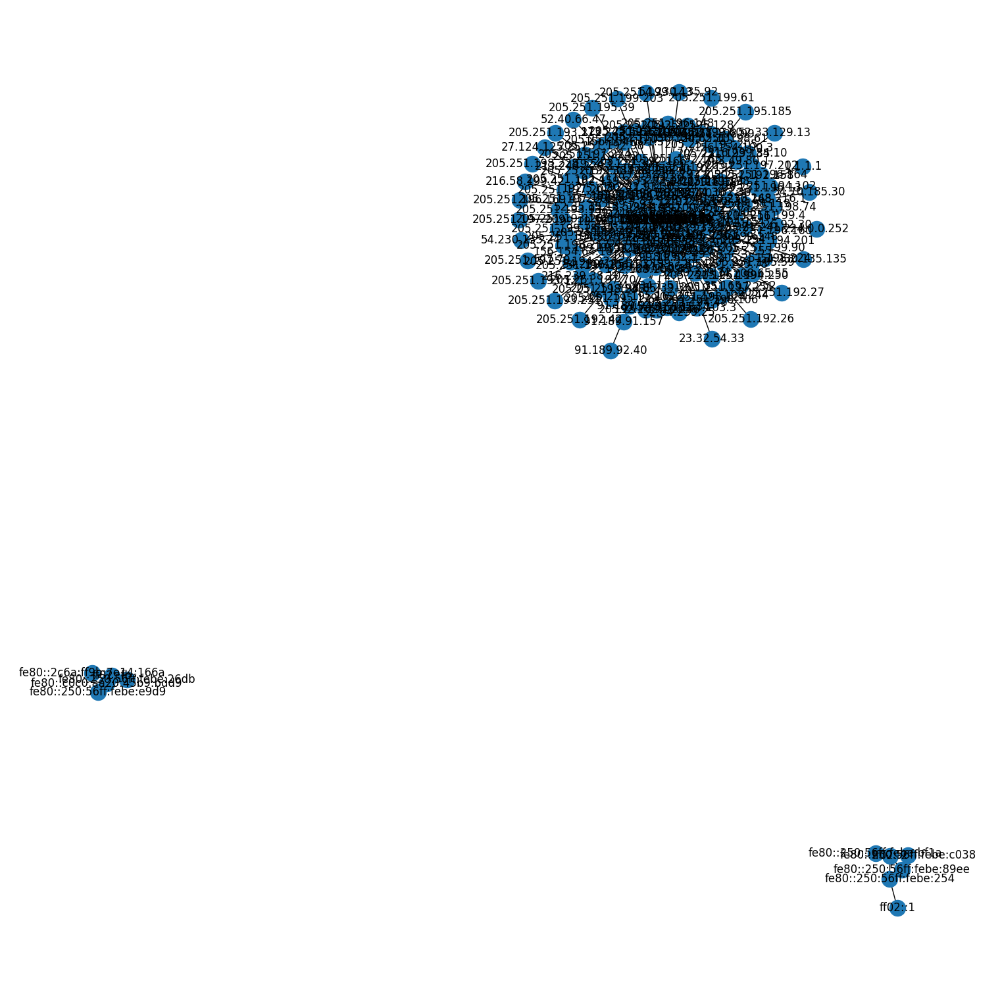

In [11]:
# Create a new graph object
G4 = nx.Graph()

# Group the data by source IP address and count the number of connections
src_counts = df_nonnull.groupby('saddr')['daddr'].value_counts()

# Add nodes to the graph for each unique source IP address
for src_ip in src_counts.index.get_level_values(0).unique():
    G4.add_node(src_ip)

# Add edges to the graph for each pair of source IP addresses with at least one connection
for (src_ip1, src_ip2), count in src_counts.items():
    if count > 0:
        G4.add_edge(src_ip1, src_ip2, weight=count)

# Plot the graph using the spring_layout function
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G4, weight='weight')
nx.draw(G4, pos=pos, with_labels=True)

# Show the plot
plt.show()


___________________________________________________________________________

**Part Two, section 6 | Automate the process of representation using graphs to let users decide which attribute as node and which attribute as edges.**  

The graph will consist of nodes and edges, where each node represents a unique value in the specified node_attr column of the dataframe, and each edge represents a relationship between the nodes based on the values in the specified edge_attr column.

Enter the node attribute: saddr
Enter the edge attribute: spkts


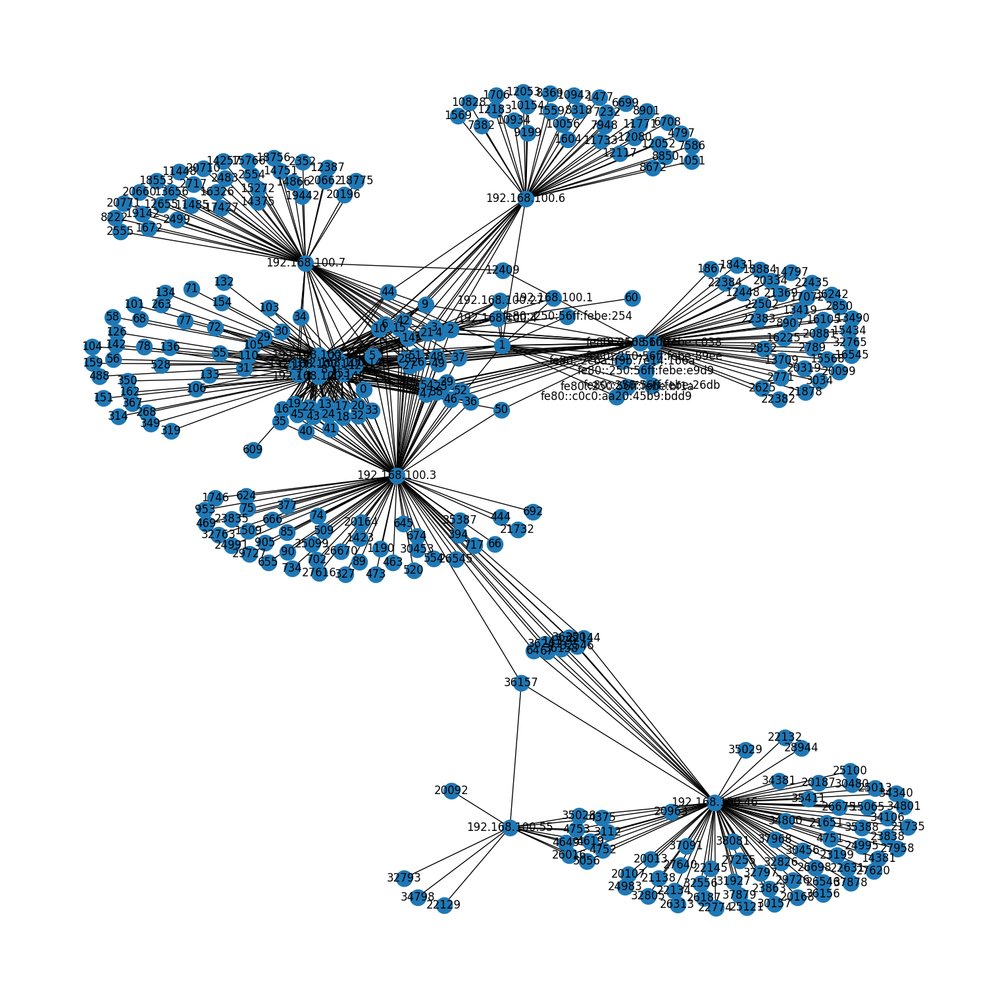

In [9]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

def create_graph(df, node_attr, edge_attr):
    # Create a new graph object
    G5 = nx.Graph()

    # Add the nodes to the graph
    nodes = set(df[node_attr])
    G5.add_nodes_from(nodes)

    # Create the edges in the graph
    edges = df[[node_attr, edge_attr]]
    for row in edges.itertuples(index=False):
        G5.add_edge(row[0], row[1])

    # Plot the graph using the spring_layout function
    plt.figure(figsize=(15, 15))
    pos = nx.spring_layout(G5, k=0.1) # adjust k value
    nx.draw(G5, pos=pos, with_labels=True)

    # Show the plot
    plt.show()

# Define the attribute to color by
node_attr = input('Enter the node attribute: ')
edge_attr = input('Enter the edge attribute: ')
create_graph(df_nonnull, node_attr, edge_attr)


___________________________________________________________________________

**PART 3**  

 **FIND PATH**  
 
It uses depth first search to find a path between the starting and ending nodes in the graph.   
The function recursively explores the graph by visiting each neighbor of the current node and checking if it leads to the destination node.  
* **If a path is found**, the function returns the path as a list of nodes.  
* **If no path is found**, it returns None.  

**COUNT PACKETS** 

The count_packets() function takes in a dataframe that represents packet transmissions between nodes and a path between two nodes represented as a list of nodes.
* creates a mask that filters the dataframe to only include rows where the source and destination nodes match the first and second nodes in the path, respectively. 
* iteratively adds more conditions to the mask to ensure that each subsequent node in the path is connected to the previous node through a transmission in the dataframe.  

In [15]:
def find_path(graph, start, end, path=None):
    """
    Find a path between the start and end nodes in the graph using depth first search.
    """
    if path is None:  # if no path is provided, create an empty path
        path = []
    path = path + [start]  # add the current node to the path
    if start == end:  # if the current node is the destination node, return the path
        return path
    for neighbor in graph[start]:  # for each neighbor of the current node
        if neighbor not in path:  # if the neighbor has not been visited
            # recursively call the function to find a path from the neighbor to the destination
            new_path = find_path(graph, neighbor, end, path)
            if new_path:  # if a path is found from the neighbor to the destination
                return new_path  # return the path
    return None  # if no path is found from the current node to the destination, return None


def count_packets(df, path):
    """Counts the number of packets sent between nodes in a given path in a dataframe."""
    
    # Initialize a boolean mask to filter the dataframe
    mask = False
    
    # Iterate over each pair of nodes in the path
    for i in range(len(path)-1):
        
        # Add a condition to the mask to filter for rows where the source and destination nodes match the current pair of nodes
        mask |= ((df['saddr'] == path[i]) & (df['daddr'] == path[i+1]))
        
        # Add a condition to the mask to filter for rows where the source and destination nodes match the current pair of nodes in the opposite order
        mask |= ((df['saddr'] == path[i+1]) & (df['daddr'] == path[i]))
    
    # Return the count of rows that match the mask
    return len(df[mask])


In [16]:
# Find a path between two nodes
path = find_path(G, '192.168.100.7', '192.168.100.4')
print("Path:", path)
# Count the number of packets sent along the path
packet_count = count_packets(df, path)
print("Packet count:", packet_count)

print()
# Find a path between two nodes
path = find_path(G, '192.168.100.27', '192.168.100.1')
print("Path:", path)
# Count the number of packets sent along the path
packet_count = count_packets(df, path)
print("Packet count:", packet_count)



Path: ['192.168.100.7', '192.168.100.4']
Packet count: 14

Path: ['192.168.100.27', '192.168.100.1']
Packet count: 68


The code finds paths between two nodes in a network graph represented by the G object.
* It finds the path between '192.168.100.7' and '192.168.100.4', and then the path between '192.168.100.27' and '192.168.100.1'.
* The code calculates the number of packets sent along each path using the count_packets function.
* The first path has only one hop and had **14 packets sent**.
* The second path has multiple hops and had **68 packets sent**.
* The paths and the number of packets sent for each path are printed out.

___________________________________________________________________________

**PART 4**  
Nodes are added to the graph for each source and destination IP address in the data, and edges are added for each communication between nodes, with the protocol type as an edge attribute. The edges are colored based on their protocol type using a custom color dictionary, and a legend is added to the plot to show the colors for each protocol. 

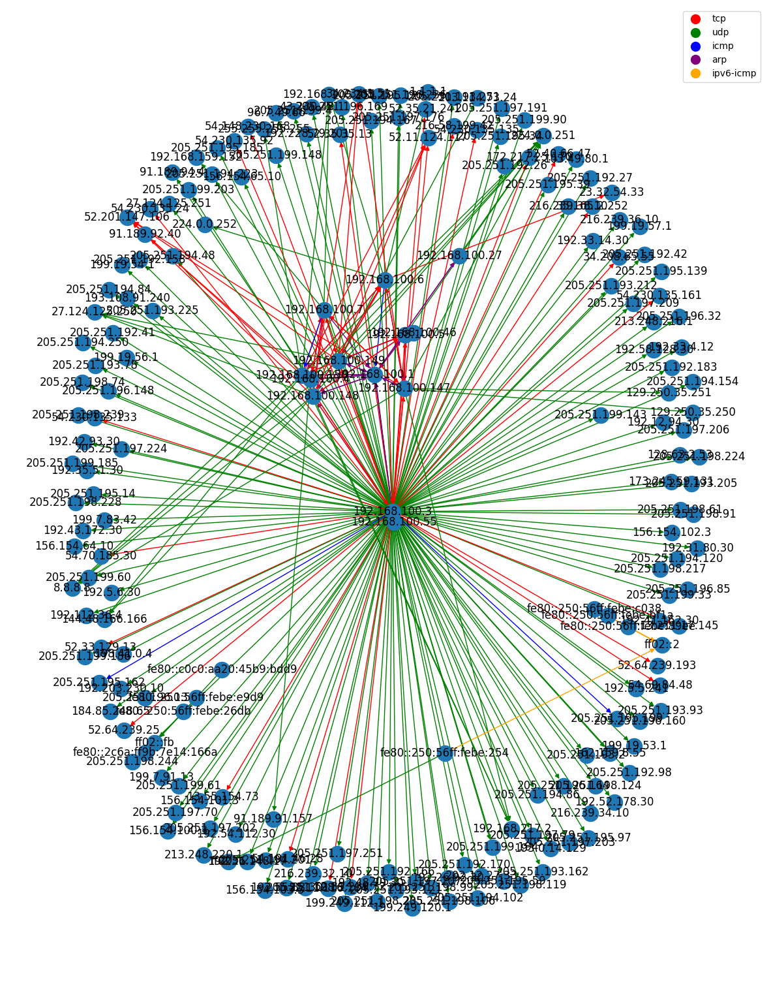

In [33]:
# Create a new graph object
G6 = nx.DiGraph()

# Add the nodes to the graph
src_ips = set(df_nonnull['saddr'])
dst_ips = set(df_nonnull['daddr'])
G6.add_nodes_from(src_ips)
G6.add_nodes_from(dst_ips)

# Create the edges in the graph
edges = df_nonnull[['saddr', 'daddr', 'proto']]
for row in edges.itertuples(index=False):
    G6.add_edge(row[0], row[1], proto=row[2])

# Define the colors for each protocol
colors = {'tcp': 'red', 'udp': 'green', 'icmp': 'blue', 'arp': 'purple', 'ipv6-icmp': 'orange'}

fig = plt.figure(figsize=(15, 8))

# Plot the graph using the spring_layout function
pos = nx.spring_layout(G6)
nx.draw(G6, pos=pos, with_labels=True,ax=fig.add_subplot(111), edge_color=[colors.get(G6.edges[e]['proto'],"black") for e in G6.edges()])

# Create a custom legend for the protocol colors
handles = [plt.Line2D([], [], color=color, marker='o', linestyle='None', markersize=10, label=proto) for proto, color in colors.items()]
plt.legend(handles=handles, loc='best')
plt.subplots_adjust(top=2)

# Show the plot
plt.show()


___________________________________________________________________________

**11. Automate the coloring so the user can choose the attribute and then the representation color based on the
difference between values.**  

The graph generated by this code represents a network of communication between nodes, where each node is either a source or a destination IP address. The edges between the nodes represent the communication paths between them, and the color of each edge represents a chosen attribute of the communication, such as the size of data transmitted or the state of the connection. By visualizing this information, the graph can help to identify patterns or anomalies in the communication patterns and gain insights into the behavior of the network.

Enter the attribute to color the graph(proto, bytes, state...) by: state
Enter the color scale (e.g., viridis,plasma,magma,rainbow...): rainbow


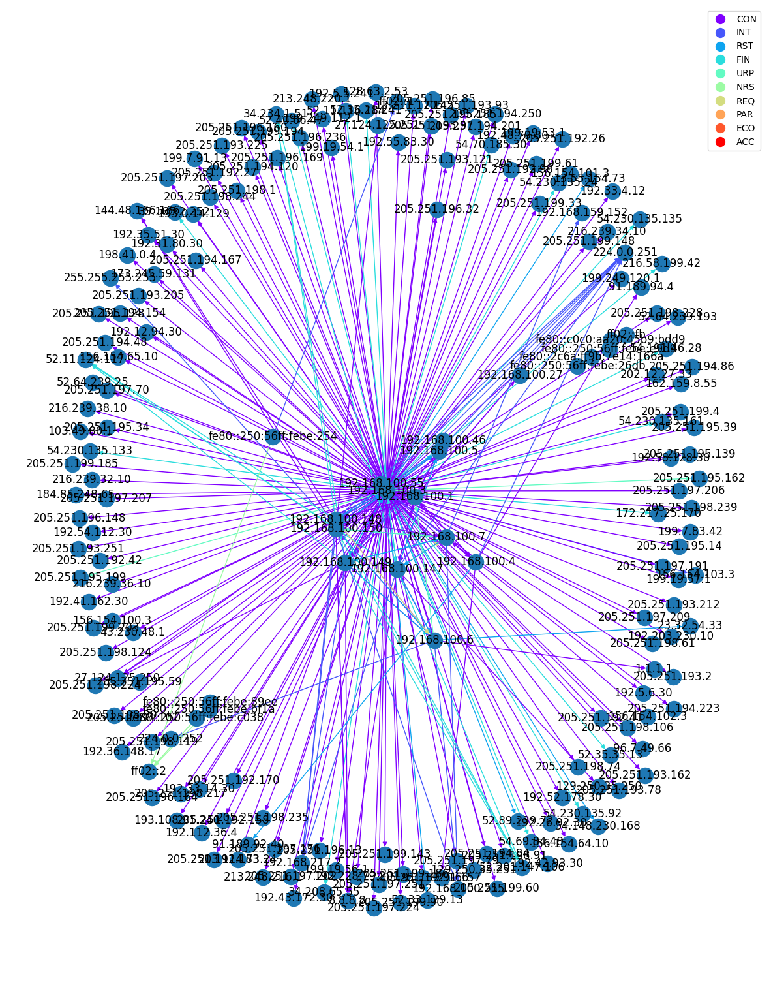

In [28]:
# Define the attribute to color by
color_attribute = input('Enter the attribute to color the graph(proto, bytes, state...) by: ')
color_scale = input('Enter the color scale (e.g., viridis,plasma,magma,rainbow...): ')

# Define the color map based on the difference between attribute values
unique_values = df_nonnull[color_attribute].unique()
num_values = len(unique_values)
color_map = plt.get_cmap(color_scale, num_values)

# Map the attribute values to colors
colors = {val: color_map(i) for i, val in enumerate(unique_values)}

# Create a new graph object
G7 = nx.DiGraph()

# Add the nodes to the graph
src_ips = set(df_nonnull['saddr'])
dst_ips = set(df_nonnull['daddr'])
G7.add_nodes_from(src_ips)
G7.add_nodes_from(dst_ips)

# Create the edges in the graph
edges = df_nonnull[['saddr', 'daddr', color_attribute]]
for row in edges.itertuples(index=False):
    G7.add_edge(row[0], row[1], **{color_attribute: row[2]})

# Plot the graph using the spring_layout function
pos = nx.spring_layout(G7)

# Get the attribute values for each edge
edge_colors = [colors.get(G7.edges[e][color_attribute], "black") for e in G7.edges()]

# Draw the graph with colored edges
fig = plt.figure(figsize=(15, 8))
nx.draw(G7, pos=pos, with_labels=True, edge_color=edge_colors, ax=fig.add_subplot(111))

# Create a custom legend for the attribute values and colors
handles = [plt.Line2D([], [], color=colors[val], marker='o', linestyle='None', markersize=10, label=val) for val in unique_values]
plt.legend(handles=handles, loc='best')
plt.subplots_adjust(top=2)

# Show the plot
plt.show()


___________________________________________________________________________

**Part Five**  

**Lets' analyze the graph of Part 2.(5)  First representation uses “IP” as a node and an event as edges.**  

Degree connectivity refers to the number of edges that a node must remove in order to disconnect a graph.   

Because connectivity is zero, the graph is a connected graph, meaning that there is a path between any two nodes in the graph.


In [35]:
degree_connectivity = nx.node_connectivity(G)
print("Degree connectivity:", degree_connectivity)


Degree connectivity: 0


___________________________________________________________________________

**Closeness centrality** measures how quickly a node can reach other nodes in the graph. A node with high closeness centrality is one that is located close to many other nodes and can quickly access them. The nodes with the highest closeness centrality values are '192.168.100.1' and '192.168.100.3'. These nodes are likely central to the network and are important for the overall connectivity of the graph. The nodes with low closeness centrality values are likely located on the periphery of the network and are less important for overall connectivity.

In [44]:
closeness_centrality = nx.closeness_centrality(G)
closeness_list = list(closeness_centrality.items())

closeness_df = pd.DataFrame(closeness_list, columns=['Node', 'Closeness'])
closeness_df = closeness_df.set_index('Node')

display(closeness_df.sort_values("Closeness",ascending=False).head())

,Closeness
Node,
192.168.100.3,0.879070
192.168.100.1,0.513587
192.168.100.150,0.510811
192.168.100.148,0.506702
192.168.100.147,0.506702


___________________________________________________________________________

**Betweenness centrality** is a measure used in graph theory that quantifies the importance of a node within a network. It is based on the idea that nodes that occur on many shortest paths between other nodes have higher importance in the network.

The betweenness centrality of a node is defined as the number of shortest paths between all pairs of nodes in the network that pass through that node. A node with high betweenness centrality is one that lies on many of these shortest paths.

In table below, each key represents a node in the network and the corresponding value is the betweenness centrality of that node. For example, the node with IP address 192.168.100.3 has a high betweenness centrality of 0.0483, indicating that it is an important node in the network.

In [43]:
betweenness_centrality = nx.betweenness_centrality(G)
betweenness_list = list(betweenness_centrality.items())

betweenness_df = pd.DataFrame(betweenness_list, columns=['Node', 'Betweenness'])
betweenness_df = betweenness_df.set_index('Node')

display(betweenness_df.sort_values("Betweenness",ascending=False).head())


,Betweenness
Node,
192.168.100.3,0.972537
192.168.100.150,0.043213
192.168.100.6,0.034979
192.168.100.147,0.034568
192.168.100.4,0.031603


___________________________________________________________________________

**Network density** is a measure of how well-connected a network is. Specifically, it measures the proportion of all possible connections between nodes that actually exist in the network.
  
The network density is 0.006741293532338309, which indicates that only a small fraction of all possible connections between nodes in the network actually exist.  

Overall, a network with low density may be less efficient at transmitting information and less robust to node failures



In [33]:
network_density = nx.density(G)
print("Network density:", network_density)


Network density: 0.006741293532338309


___________________________________________________________________________

The **network diameter** is a measure of the longest path between any two nodes in a network, represented by the maximum number of edges that must be traversed to get from one node to another node.  

A network diameter of 4 indicates that the longest path between any two nodes in the network is at most 4 edges long. This suggests that the network is relatively well-connected and efficient for transmitting information or other flows between its nodes.





In [37]:
largest_component = max(nx.connected_components(G.to_undirected()), key=len)
network_diameter = nx.diameter(G.subgraph(largest_component).to_undirected())
print("Network diameter:", network_diameter)


Network diameter: 4


___________________________________________________________________________
The **network average path length** is a measure of the average number of edges that must be traversed to get from one node to another node in a network.  

The network average path length of 2.231077694235589 means that on average, it takes a little over two edges to connect any two nodes in the largest connected component of the network. This is a relatively small average path length, suggesting that the network is relatively well-connected and efficient for transmitting information or other flows between its nodes.





In [39]:
largest_component = max(nx.connected_components(G.to_undirected()), key=len)
if G.is_directed():
    G = G.subgraph(largest_component).to_undirected()
network_avg_path_length = nx.average_shortest_path_length(G)
print("Network average path length:", network_avg_path_length)


Network average path length: 2.231077694235589


**Conclusion of Dataset**  

The analysis refers to two different graphs in the provided information. The first is a heatmap that shows the correlation between different features in the dataset. The second is a graph representation of network traffic data using IP addresses as nodes and events as edges.

Starting with the heatmap, it shows that there is a high positive correlation between the start time of the communication and the type of attack/subcategory. This implies that the start time of a communication can be used as an indicator of the type of attack/subcategory. Additionally, there is a moderate positive correlation between the duration of the communication and the type of attack/subcategory. This suggests that the duration of a communication can also be used as an indicator, although it may not be as strong as the start time.

Moving on to the bar chart, it displays the frequency of different attack types in the dataset. The analysis reveals that Attack 1 has the highest frequency, indicating that it is the most common type of attack in the dataset. The red bar, representing another type of attack, is very small, indicating that it is much less common. Additionally, the majority of packets have a duration of 0 to 500 seconds, with a single bar in the histogram reaching the maximum frequency value.

**Conclusion of Graph Analysis and representaion for PART 2, 5a | First representation uses “IP” as a node and an event as edges**  

In the graph representation of the network traffic data, it is found that the nodes with the highest closeness centrality values are '192.168.100.3' and '192.168.100.1'. These nodes are likely central to the network and are important for the overall connectivity of the graph. Additionally, the node with IP address 192.168.100.3 has a high betweenness centrality of 0.9725, indicating that it is an important node in the network. The other nodes with high betweenness centrality values are likely also important in the network.

Finally, the analysis shows that the network has a low degree connectivity, which means that it is not easy to disconnect the graph by removing nodes. The network density is also relatively low, which suggests that there are not many connections between nodes in the network.

In summary, the analysis provides insights into the correlation between different features in the dataset and the network traffic data. The findings can be useful in identifying the most common type of attack in the dataset and the nodes that are central to the network and important for its overall connectivity. The low degree connectivity and network density suggest that the network may not be very robust and may be vulnerable to attacks or disruptions.